### Insurance Claim Fraud Detection

#### Project Description  

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.
In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 
In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

#### Independent Variables

1.	months_as_customer: Number of months of patronage
2.	age: the length of time a customer has lived or a thing has existed
3.	policy_number: It is a unique id given to the customer, to track the subscription status and other details of customer
4.	policy_bind_date:date which document that is given to customer after we accept your proposal for insurance
5.	policy_state: This identifies who is the insured, what risks or property are covered, the policy limits, and the policy period
6.	policy_csl: is basically Combined Single Limit
7.	policy_deductable: the amount of money that a customer is responsible for paying toward an insured loss
8.	policy_annual_premium: This means the amount of Regular Premium payable by the Policyholder in a Policy Year
9.	umbrella_limit: This means extra insurance that provides protection beyond existing limits and coverages of other policies
10.	insured_zip: It is the zip code where the insurance was made
11.	insured_sex: This refres to either of the two main categories (male and female) into which customer are divided on the basis of their reproductive functions
12.	insured_education_level: This refers to the Level of education of the customer
13.	insured_occupation: This refers Occupation of the customer
14.	insured_hobbies: This refers to an activity done regularly by customer in his/her leisure time for pleasure.
15.	insured_relationship: This whether customer is: single; or. married; or. in a de facto relationship (that is, living together but not married); or. in a civil partnership
16.	capital-gains: This refers to profit accrued due to insurance premium
17.	capital-loss: This refers to the losses incurred due to insurance claims
18.	incident_date: This refers to the date which claims where made by customers
19.	incident_type: This refers to the type of claim/vehicle damage made by customer
20.	collision_type: This refers to the area of damage on the vehicle
21.	incident_severity: This refers to the extent/level of damage
22.	authorities_contacted: This refers to the government agencies that were contacted after damage
23.	incident_state: This refers to the state at which the accident happened
24.	incident_city: This refers to the city at which the accident happened
25.	1ncident_location: This refers to the location at which the accident happened
26.	incident_hour_of_the_day: The period of the day which accident took place
27.	number_of_vehicles_involved: This refers to number of vehicles involved the accident
28.	property_damage: This refers to whether property was damaged or not
29.	bodily_injuries: This refers to injuries sustained
30.	witnesses: This refers to the number of witnesses involved
31.	police_report_available: This refers to whether the report on damage was documented or not
32.	total_claim_amount: This refers to the financial implications involved in claims
33.	injury_claim: This refers to physical injuries sustained
34.	property_claim: This refers to property damages during incident
35.	vehicle_claim: This refers to property damages during incident
36.	auto_make: This refers to the make of the vehicle
37.	auto_model: This refers to the model of the vehicle
38.	auto_year: This refers to the year which the vehicle was manufactured
39.	_c39:
40.	fraud_reported

#### Dataset Link-    

•	https://github.com/dsrscientist/Data-Science-ML-Capstone-Projects/blob/master/Automobile_insurance_fraud.csv


In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

### # Data Gathering

In [2]:
pd.set_option('display.max_columns', None)
data=pd.read_csv(r'https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv')
data.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


### # Data Pre-processing

In [3]:
data.shape

(1000, 40)

#### Rows : 1000, Columns : 40

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

#### Object columns : 21   
#### int64 columns  : 17
#### float64 columns  : 2


#### # Observation : 
column '_c39' is showing '0' non null values

#### checking for the column '_c39'

In [5]:
data['_c39'].value_counts()

Series([], Name: _c39, dtype: int64)

#### As the column '_c39' is having all null values we drop this column

In [6]:
data.drop(['_c39'], axis=1, inplace=True)
data.sample(5)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
125,206,39,965768,27-07-2014,IN,250/500,1000,1302.40,6000000,603948,MALE,JD,craft-repair,dancing,unmarried,47200,-69700,17-02-2015,Multi-vehicle Collision,Rear Collision,Total Loss,Ambulance,NY,Hillsdale,1598 3rd Drive,12,3,NO,2,3,YES,36300,3300,9900,23100,Ford,Escape,2013,N
383,289,46,858060,31-05-2004,IL,250/500,2000,1209.07,0,604138,MALE,JD,armed-forces,chess,unmarried,0,0,28-02-2015,Single Vehicle Collision,Rear Collision,Minor Damage,Ambulance,NC,Arlington,5649 Texas Ave,18,1,YES,0,1,YES,56430,6270,6270,43890,BMW,3 Series,1995,Y
152,104,32,904191,14-07-1997,IN,250/500,500,1158.03,0,434247,MALE,High School,exec-managerial,kayaking,own-child,31900,-44600,08-01-2015,Multi-vehicle Collision,Rear Collision,Total Loss,Police,NY,Riverwood,7582 Pine Drive,23,3,YES,1,3,YES,63570,9780,9780,44010,Volkswagen,Jetta,2006,Y
155,375,50,120485,18-02-2007,OH,100/300,1000,1275.39,0,466283,MALE,Associate,sales,bungie-jumping,other-relative,0,0,12-02-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,NY,Riverwood,8150 Washington Ridge,16,1,YES,2,3,NO,37280,0,0,37280,Audi,A5,1996,Y
37,289,49,933293,03-02-1993,IL,500/1000,2000,1222.48,0,620757,FEMALE,JD,priv-house-serv,golf,unmarried,0,0,18-01-2015,Parked Car,?,Minor Damage,None,WV,Arlington,6676 Tree Lane,16,1,NO,1,1,YES,5330,1230,820,3280,Suburu,Legacy,2001,N


#### #Now the column '_c39' is droped 

#### Our Target column is 'Income', lets check for the data in the column

In [7]:
data['fraud_reported'].value_counts()

N    753
Y    247
Name: fraud_reported, dtype: int64

#### Observation:  
the Target column is containing categorical data, and specifically Binary data 

#### So our problem is related to Classification

#### # Getting Null values, white spaces , '-' and 'NA' values in the dataset

In [8]:
data.isnull().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

In [9]:
data.isin([' ','NA','-']).sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

#### Observations:
1. No Null values in the dataset
2. No white space, NA values or ' - ' in the dataset

#### # getting unique values in each columns

In [10]:
#checking for value counts in each column
for column in data:
    print(data[column].value_counts(),'\n\n')

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64 


43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64 


521585    1
687755    1
674485    1
223404    1
991480    1
         ..
563878    1
620855    1
583169    1
337677    1
556080    1
Name: policy_number, Length: 1000, dtype: int64 


01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: policy_bind_date, Length: 951, dtype: in

#### Observations:  

#### Columns having Categorical data:
1. policy_state
2. policy_csl
3. policy_deductable
4. umbrella_limit
5. insured_sex
6. insured_education_level
7. insured_occupation
8. insured_hobbies
9. insured_relationship
10. incident_date
11. incident_type
12. collision_type
13. incident_severity
14. authorities_contacted
15. incident_state
16. incident_city
17. incident_hour_of_the_day
18. number_of_vehicles_involved
19. property_damage
20. bodily_injuries
21. witnesses
22. police_report_available
23. auto_make
24. auto_model
25. auto_year
26. fraud_reported

#### Columns having Conitions data :  
1. months_as_customer
2. age
3. policy_number
4. policy_bind_date
5. policy_annual_premium
6. insured_zip
7. capital-gains
8. capital-loss
9. incident_location
10. total_claim_amount
11. injury_claim
12. property_claim
13. vehicle_claim

#### # Encoding the Object datatype

In [11]:
from sklearn.preprocessing import LabelEncoder

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [13]:
lab=LabelEncoder()

In [14]:
df=lab.fit_transform(data['policy_state'])
pd.Series(df)
data['policy_state']=df

df=lab.fit_transform(data['policy_csl'])
pd.Series(df)
data['policy_csl']=df

df=lab.fit_transform(data['insured_sex'])
pd.Series(df)
data['insured_sex']=df

df=lab.fit_transform(data['insured_education_level'])
pd.Series(df)
data['insured_education_level']=df

df=lab.fit_transform(data['insured_occupation'])
pd.Series(df)
data['insured_occupation']=df

df=lab.fit_transform(data['insured_hobbies'])
pd.Series(df)
data['insured_hobbies']=df

df=lab.fit_transform(data['insured_relationship'])
pd.Series(df)
data['insured_relationship']=df

df=lab.fit_transform(data['incident_type'])
pd.Series(df)
data['incident_type']=df

df=lab.fit_transform(data['collision_type'])
pd.Series(df)
data['collision_type']=df

df=lab.fit_transform(data['incident_severity'])
pd.Series(df)
data['incident_severity']=df

df=lab.fit_transform(data['authorities_contacted'])
pd.Series(df)
data['authorities_contacted']=df

df=lab.fit_transform(data['incident_state'])
pd.Series(df)
data['incident_state']=df

df=lab.fit_transform(data['incident_city'])
pd.Series(df)
data['incident_city']=df

df=lab.fit_transform(data['incident_location'])
pd.Series(df)
data['incident_location']=df

df=lab.fit_transform(data['property_damage'])
pd.Series(df)
data['property_damage']=df

df=lab.fit_transform(data['police_report_available'])
pd.Series(df)
data['police_report_available']=df

df=lab.fit_transform(data['auto_make'])
pd.Series(df)
data['auto_make']=df

df=lab.fit_transform(data['auto_model'])
pd.Series(df)
data['auto_model']=df

df=lab.fit_transform(data['fraud_reported'])
pd.Series(df)
data['fraud_reported']=df


In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   int32  
 5   policy_csl                   1000 non-null   int32  
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   int32  
 11  insured_education_level      1000 non-null   int32  
 12  insured_occupation           1000 non-null   int32  
 13  insured_hobbies    

#### We have two data time columns, so converting them to the date time datatype

In [16]:
data['policy_bind_date']=pd.to_datetime(data['policy_bind_date'])
data['incident_date']=pd.to_datetime(data['incident_date'])

In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   months_as_customer           1000 non-null   int64         
 1   age                          1000 non-null   int64         
 2   policy_number                1000 non-null   int64         
 3   policy_bind_date             1000 non-null   datetime64[ns]
 4   policy_state                 1000 non-null   int32         
 5   policy_csl                   1000 non-null   int32         
 6   policy_deductable            1000 non-null   int64         
 7   policy_annual_premium        1000 non-null   float64       
 8   umbrella_limit               1000 non-null   int64         
 9   insured_zip                  1000 non-null   int64         
 10  insured_sex                  1000 non-null   int32         
 11  insured_education_level      1000 non-null  

#### Now seperating the date time in day, month and year 

In [18]:
data['policy_bind_date_day']=data['policy_bind_date'].dt.day
data['policy_bind_date_mth']=data['policy_bind_date'].dt.month
data['policy_bind_date_year']=data['policy_bind_date'].dt.year

data['incident_date_day']=data['incident_date'].dt.day
data['incident_date_mth']=data['incident_date'].dt.month
data['incident_date_year']=data['incident_date'].dt.year

In [19]:
#dropping the columns
data.drop(['incident_date'], axis=1, inplace=True)
data.drop(['policy_bind_date'], axis=1, inplace=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 43 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_state                 1000 non-null   int32  
 4   policy_csl                   1000 non-null   int32  
 5   policy_deductable            1000 non-null   int64  
 6   policy_annual_premium        1000 non-null   float64
 7   umbrella_limit               1000 non-null   int64  
 8   insured_zip                  1000 non-null   int64  
 9   insured_sex                  1000 non-null   int32  
 10  insured_education_level      1000 non-null   int32  
 11  insured_occupation           1000 non-null   int32  
 12  insured_hobbies              1000 non-null   int32  
 13  insured_relationshi

#### Converting all the columns to 'float' data type

In [20]:
for column in data:
    data[column]=data[column].astype(float)

In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 43 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   float64
 1   age                          1000 non-null   float64
 2   policy_number                1000 non-null   float64
 3   policy_state                 1000 non-null   float64
 4   policy_csl                   1000 non-null   float64
 5   policy_deductable            1000 non-null   float64
 6   policy_annual_premium        1000 non-null   float64
 7   umbrella_limit               1000 non-null   float64
 8   insured_zip                  1000 non-null   float64
 9   insured_sex                  1000 non-null   float64
 10  insured_education_level      1000 non-null   float64
 11  insured_occupation           1000 non-null   float64
 12  insured_hobbies              1000 non-null   float64
 13  insured_relationshi

#### Now all the columns are converted to dtype as 'Float64'

In [22]:
data.sample(10)

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_date_day,policy_bind_date_mth,policy_bind_date_year,incident_date_day,incident_date_mth,incident_date_year
523,85.0,30.0,190588.0,2.0,0.0,1000.0,796.35,0.0,614166.0,0.0,4.0,2.0,18.0,3.0,72400.0,-77000.0,0.0,2.0,2.0,1.0,4.0,3.0,141.0,9.0,3.0,2.0,2.0,1.0,2.0,58960.0,5360.0,10720.0,42880.0,5.0,14.0,2004.0,0.0,12.0,9.0,2001.0,20.0,2.0,2015.0
379,157.0,32.0,347984.0,2.0,0.0,2000.0,617.11,0.0,436711.0,1.0,1.0,7.0,15.0,2.0,0.0,-54100.0,0.0,1.0,0.0,3.0,5.0,1.0,634.0,14.0,3.0,0.0,1.0,2.0,1.0,50800.0,10160.0,5080.0,35560.0,8.0,12.0,2013.0,1.0,21.0,10.0,2009.0,1.0,2.0,2015.0
105,295.0,49.0,872814.0,0.0,0.0,500.0,1141.62,0.0,451672.0,1.0,1.0,9.0,11.0,0.0,34300.0,-24300.0,3.0,0.0,1.0,2.0,6.0,1.0,799.0,4.0,1.0,2.0,1.0,3.0,2.0,4320.0,480.0,480.0,3360.0,8.0,12.0,2002.0,0.0,13.0,6.0,1992.0,1.0,1.0,2015.0
991,257.0,44.0,109392.0,2.0,0.0,1000.0,1280.88,0.0,433981.0,1.0,4.0,7.0,1.0,2.0,59400.0,-32200.0,2.0,2.0,2.0,3.0,6.0,5.0,480.0,21.0,1.0,1.0,0.0,1.0,1.0,46980.0,0.0,5220.0,41760.0,0.0,33.0,2002.0,0.0,7.0,12.0,2006.0,2.0,6.0,2015.0
928,84.0,30.0,844007.0,1.0,2.0,2000.0,1827.38,0.0,433593.0,1.0,0.0,8.0,14.0,2.0,0.0,-15900.0,3.0,0.0,3.0,4.0,5.0,6.0,564.0,9.0,1.0,2.0,1.0,3.0,0.0,4620.0,420.0,840.0,3360.0,1.0,5.0,1998.0,0.0,17.0,7.0,1995.0,15.0,1.0,2015.0
663,172.0,33.0,100804.0,0.0,0.0,1000.0,1459.96,6000000.0,600127.0,0.0,2.0,0.0,15.0,5.0,41300.0,-42000.0,0.0,3.0,2.0,0.0,1.0,3.0,815.0,15.0,3.0,1.0,0.0,1.0,1.0,41690.0,7580.0,7580.0,26530.0,10.0,3.0,1999.0,0.0,24.0,2.0,2012.0,1.0,7.0,2015.0
394,157.0,31.0,121439.0,1.0,2.0,500.0,1257.83,7000000.0,458622.0,1.0,2.0,4.0,15.0,3.0,40700.0,-41600.0,0.0,2.0,0.0,3.0,2.0,0.0,650.0,2.0,4.0,1.0,2.0,2.0,1.0,47700.0,4770.0,9540.0,33390.0,0.0,33.0,2011.0,1.0,8.0,2.0,1990.0,14.0,2.0,2015.0
367,289.0,47.0,594722.0,2.0,2.0,2000.0,1102.29,0.0,450889.0,0.0,0.0,0.0,10.0,3.0,73000.0,-37900.0,2.0,1.0,1.0,0.0,5.0,3.0,188.0,15.0,1.0,1.0,1.0,0.0,2.0,54000.0,6000.0,6000.0,42000.0,12.0,18.0,1996.0,0.0,31.0,7.0,1999.0,31.0,1.0,2015.0
140,211.0,35.0,682387.0,2.0,0.0,2000.0,1221.22,0.0,451586.0,1.0,5.0,6.0,4.0,2.0,76000.0,0.0,2.0,2.0,2.0,4.0,1.0,3.0,598.0,2.0,1.0,2.0,0.0,1.0,0.0,52030.0,9460.0,4730.0,37840.0,8.0,12.0,2008.0,0.0,3.0,8.0,1998.0,21.0,1.0,2015.0
25,8.0,35.0,699044.0,2.0,0.0,2000.0,1266.92,0.0,613982.0,1.0,5.0,11.0,14.0,3.0,0.0,0.0,0.0,2.0,0.0,3.0,2.0,0.0,262.0,16.0,3.0,1.0,1.0,3.0,2.0,71500.0,16500.0,11000.0,44000.0,5.0,13.0,2006.0,1.0,12.0,5.0,2013.0,1.0,9.0,2015.0


### # EDA

#### Looking for basic stats

In [23]:
data.describe()

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_date_day,policy_bind_date_mth,policy_bind_date_year,incident_date_day,incident_date_mth,incident_date_year
count,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.00000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.0
mean,203.954000,38.948000,546238.648000,1.01400,0.951000,1136.000000,1256.406150,1.101000e+06,501214.488000,0.463000,2.966000,6.653000,9.731000,2.416000,25126.100000,-26793.700000,1.172000,1.666000,1.184000,2.167000,3.242000,2.966000,499.500000,11.644000,1.83900,0.94200,0.992000,1.487000,0.971000,52761.94000,7433.420000,7399.570000,37928.950000,6.546000,19.318000,2005.103000,0.247000,15.448000,6.559000,2001.604000,13.08400,3.407000,2015.0
std,115.113174,9.140287,257063.005276,0.83096,0.804516,611.864673,244.167395,2.297407e+06,71701.610941,0.498879,1.948497,4.019048,5.674049,1.681003,27872.187708,28104.096686,1.081474,1.063755,0.939695,1.532142,2.155942,2.044266,288.819436,6.951373,1.01888,0.81197,0.820127,1.111335,0.810442,26401.53319,4880.951853,4824.726179,18886.252893,4.034869,11.136107,6.015861,0.431483,8.850176,3.391758,7.360391,10.44318,3.276291,0.0
min,0.000000,19.000000,100804.000000,0.00000,0.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-111100.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,0.00000,0.000000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,0.000000,0.000000,1995.000000,0.000000,1.000000,1.000000,1990.000000,1.00000,1.000000,2015.0
25%,115.750000,32.000000,335980.250000,0.00000,0.000000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,1.000000,3.000000,5.000000,1.000000,0.000000,-51500.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,249.750000,6.000000,1.00000,0.00000,0.000000,1.000000,0.000000,41812.50000,4295.000000,4445.000000,30292.500000,3.000000,10.000000,2000.000000,0.000000,8.000000,4.000000,1995.000000,2.00000,1.000000,2015.0
50%,199.500000,38.000000,533135.000000,1.00000,1.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,3.000000,7.000000,10.000000,2.000000,0.000000,-23250.000000,1.000000,2.000000,1.000000,2.000000,4.000000,3.000000,499.500000,12.000000,1.00000,1.00000,1.000000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,7.000000,20.000000,2005.000000,0.000000,16.000000,7.000000,2002.000000,15.00000,2.000000,2015.0
75%,276.250000,44.000000,759099.750000,2.00000,2.000000,2000.000000,1415.695000,0.000000e+00,603251.000000,1.000000,5.000000,10.000000,15.000000,4.000000,51025.000000,0.000000,2.000000,3.000000,2.000000,4.000000,5.000000,5.000000,749.250000,17.000000,3.00000,2.00000,2.000000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,10.000000,29.000000,2010.000000,0.000000,23.000000,9.000000,2008.000000,22.00000,5.000000,2015.0
max,479.000000,64.000000,999435.000000,2.00000,2.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,1.000000,6.000000,13.000000,19.000000,5.000000,100500.000000,0.00000

#### Observations: 
looking at the columns which are having continious data below are the observations:  

1. Column months_as_customer: ranges from 0.00 to 479.00 where data is distributed around mean as mean and 50% are almost equal
2. Column age : rangest from 19 to 64 where data is also distributed around mean
3. Column policy_number: this column is having only Identities to the policy, so this column is not that important
4. Column policy_annual_premium : ranges from 433.33 to 2047 and distribution is around mean, but the max and min side are comparitively very small and large respectively as per the range of data
5. Column insured_zip: ranges from 430104.00 to 620962.00 and distribution Not seems to be around mean as 50% and mean are not close to each other
6. Column capital-gains: rangest from 0.00 to 100500.0 and data NOT seems to be distributed normally around mean
7. Column capital-loss : ranges from -111100.00 to 0.00 with distribution seems to be around mean
8. Column incident_location : this column is having continious data but only providing infromation about the location of the incident, so this column is not that important
9. Column total_claim_amount : ranges from 100.00 to 114920.00 with distribution not seems to be around mean as 50% and mean value differs very much. Also Min and Max values are likely to be very low and high respectively compared to the data range
10. Column injury_claim : ranges from 0 to 21450.00 and distribution not seems to be around mean as 50% and mean value differs very much. Also Min and Max values are likely to be very low and high respectively compared to the data range
11. Column property_claim : ranges from 0 to 23670.00 and distribution not seems to be around mean as 50% and mean value differs very much. Also Min and Max values are likely to be very low and high respectively compared to the data range
12. Column vehicle_claim : ranges from 70.00 to 79560.00 and distribution is not seem to be around mean as the values mean and 50% are not similar. Also Min and Max values are likely to be very low and high respectively compared to the data range



#### # Distplot

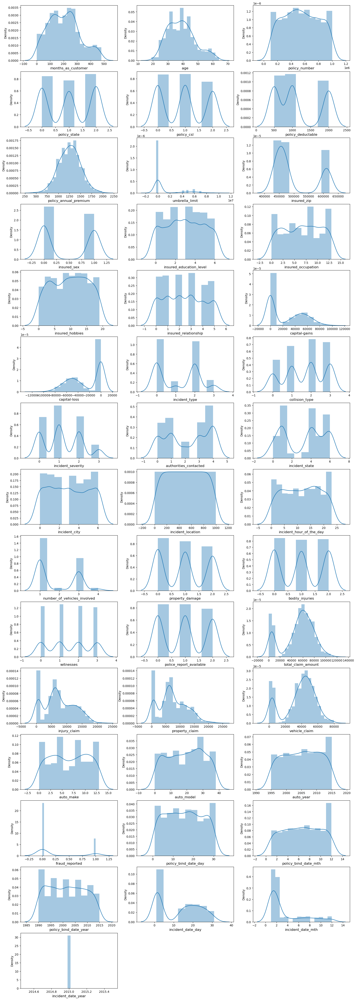

In [24]:
plt.figure(figsize=(20,60))
pltno=1
for column in data:
    if pltno<=43:
        plt.subplot(15,3,pltno)
        sns.distplot(data[column] )
        plt.xlabel(column, fontsize=12)
    pltno+=1
plt.show()

#### Observations:
1. skewness on Right side seen for the columns - 'umbrella_limit', 'capital-gains'
2. skewness on Left side seen for the columns - 'capital-loss'


#### # Box plot

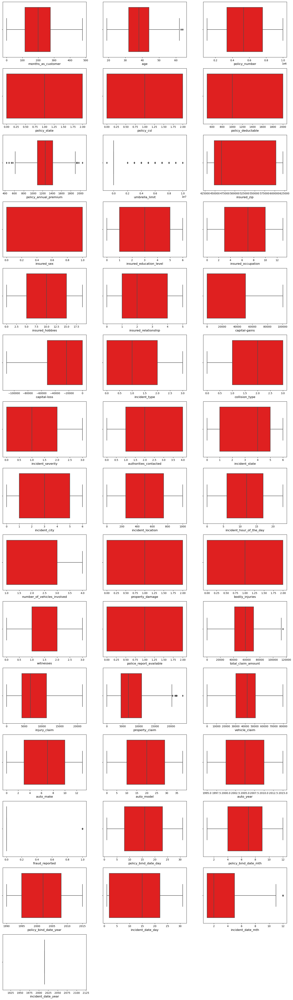

In [25]:
plt.figure(figsize=(20,70))
pltno=1
for column in data:
    if pltno<=43:
        plt.subplot(15,3,pltno)
        sns.boxplot(data[column], color='red' )
        plt.xlabel(column, fontsize=12)
    pltno+=1
plt.show()

#### Observations:
1. Outliers on Max side for columns : 'Age', 'total_claim_amount', 'property_claim', 'fraud_reported'
2. Outliers on Both side for columns : 'policy_annual_premium', 'umbrella_limit'


#### # Checking for Skewness

In [26]:
data.skew()

months_as_customer             0.362177
age                            0.478988
policy_number                  0.038991
policy_state                  -0.026177
policy_csl                     0.088928
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_zip                    0.816554
insured_sex                    0.148630
insured_education_level       -0.000148
insured_occupation            -0.058881
insured_hobbies               -0.061563
insured_relationship           0.077488
capital-gains                  0.478850
capital-loss                  -0.391472
incident_type                  0.101507
collision_type                -0.193345
incident_severity              0.279016
authorities_contacted         -0.121744
incident_state                -0.148865
incident_city                  0.049531
incident_location              0.000000
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664


#### Observation:
Skewness seen in columns - 'umbrella_limit', 'fraud_reported', 'incident_date_mth'

Now as the column 'fraud_reported' is our Target column so we keep this column as it is,  
column 'umbrella_limit' is having categorical values so we keep this column as it is as well,  
Also 'incident_date_mth' is showing month for the incident only so we also keep this column as it is

So we shall keep the data as it is as proceed 

In [27]:
data.corr()

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_date_day,policy_bind_date_mth,policy_bind_date_year,incident_date_day,incident_date_mth,incident_date_year
months_as_customer,1.000000,0.922098,0.057555,-0.000328,-0.026819,0.026807,0.005018,0.015498,0.017895,0.060925,-0.000833,0.009814,-0.093661,0.069727,0.006399,0.020209,-0.017377,-0.017824,-0.059581,0.010021,0.005369,-0.000130,-0.013630,0.070639,0.014736,0.007040,-0.010162,0.058383,0.017647,0.062108,0.065329,0.034940,0.061013,0.047655,0.004202,-0.000292,0.020544,0.051728,0.005750,-0.048276,-0.011092,0.024659,NaN
age,0.922098,1.000000,0.059413,-0.014533,-0.015185,0.029188,0.014404,0.018126,0.025604,0.073337,0.000969,0.017220,-0.081315,0.074832,-0.007075,0.007368,-0.025626,-0.018672,-0.058439,0.015417,0.005770,-0.002291,-0.011101,0.087161,0.022102,-0.001486,-0.015679,0.052359,0.014661,0.069863,0.075522,0.060898,0.062588,0.030410,0.017343,0.001354,0.012143,0.053869,0.015501,-0.037444,-0.006131,0.023404,NaN
policy_number,0.057555,0.059413,1.000000,0.072815,0.038917,-0.006738,0.022566,0.008968,0.007083,0.004564,-0.037264,-0.014422,0.039896,0.017120,0.009802,-0.005669,0.001742,-0.013402,-0.015719,0.018565,-0.010064,-0.035406,0.016393,0.000113,0.013432,0.005575,-0.004558,-0.012661,0.032019,-0.018009,-0.008762,-0.010678,-0.020184,0.023860,0.065240,-0.000183,-0.029443,0.041885,0.005509,-0.040099,0.057199,-0.042512,NaN
policy_state,-0.000328,-0.014533,0.072815,1.000000,0.001027,0.010033,0.012455,-0.029580,0.008777,-0.020481,-0.034327,-0.031215,-0.038689,-0.018506,0.074551,-0.030338,0.031848,0.034739,-0.026377,-0.016777,0.008723,-0.002077,0.029534,0.029457,-0.042263,0.008623,0.013384,0.022960,0.071950,-0.006002,-0.046290,0.008406,0.001425,0.017124,-0.025253,0.002114,0.029432,0.002277,0.071450,-0.007276,0.014745,0.023643,NaN
policy_csl,-0.026819,-0.015185,0.038917,0.001027,1.000000,0.003384,0.023978,0.021636,0.006879,-0.010757,0.009153,0.015788,-0.005960,-0.030063,0.005249,-0.034612,0.011997,-0.036687,0.022530,0.056182,0.032814,0.009333,0.047704,-0.001869,-0.019403,-0.027340,-0.000595,0.071500,0.002424,-0.055758,-0.078818,-0.042216,-0.046791,-0.004701,0.047885,-0.033082,-0.037190,0.018973,-0.045345,-0.016466,-0.004156,-0.011794,NaN
policy_deductable,0.026807,0.029188,-0.006738,0.010033,0.003384,1.000000,-0.003245,0.010870,0.004545,-0.009733,0.015217,-0.046733,0.004061,-0.022945,0.035212,-0.023544,-0.038411,-0.033182,-0.015711,-0.000760,0.006517,-0.045117,-0.009281,0.060935,0.051214,0.016900,-0.022765,0.066639,0.030166,0.022839,0.039107,0.064792,0.005269,-0.035379,-0.003268,0.026105,0.014817,0.009164,-0.050416,-0.049598,-0.018160,-0.006418,NaN
policy_annual_premium,0.005018,0.014404,0.022566,0.012455,0.023978,-0.003245,1.000000,-0.006247,0.032354,0.038853,-0.019715,0.035922,-0.018019,0.001925,-0.013738,0.023547,0.053603,0.036719,-0.011155,-0.055191,0.046434,0.048724,0.017883,-0.001578,-0.045991,0.095359,0.026780,0.002332,0.013624,0.009094,-0.017633,-0.011654,0.020246,0.000045,-0.031849,-0.049226,-0.014480,-0.025183,-0.035355,0.001249,0.014835,0.021559,NaN
umbrella_limit,0.015498,0.018126,0.008968,-0.029580,0.021636,0.010870,-0.006247,1.000000,0.019671,0.010688,-0.019357,0.023422,-0.037000,0.077495,-0.047268,-0.024056,0.015966,-0.025913,0.009466,0.029044,-0.077492,0.013094,0.014510,-0.023257,-0.021270,-0.056957,0.022743,-0.006738,-0.055951,-0.040344,-0.045412,-0.023790,-0.038584,-0.004443,0.040256,0.009893,0.058622,-0.045207,0.009961,0.048008,-0.0

### # Multi-corelation heatmap

In [28]:
plt.subplots(figsize=(230,200))
sns.set(font_scale=18)
sns.heatmap(data.corr(),cmap='YlGnBu',annot=True, linewidth=.5, annot_kws={"size":60})
plt.show()

#### # Observation:
1. 'months_as_customer' and 'age' are 92% coreated
2. 'number_of_vehicles_involved' and 'incident_type' are -89% coreated
3. 'vehicle_claim' and 'total_claim_amount' are 98% coreated
4. 'incident_date_year' containing single value - 2015, that means this data is only for the year 2015  

#### Now corelation of these columns with Target column
1. 'age' is 1.21 % corelated to Target column
2. 'months_as_customer' is 2.0 % corelated to Target column
3. 'number_of_vehicles_involved' is 5.18 % corelated to Target column
4. 'incident_type' is -5.03 % corelated to Target column
5. 'vehicle_claim' is 17.00 % corelated to Target column
6. 'total_claim_amount' is 16.36 % corelated to Target column

#### Hence we are dropping columns - 'age', 'number_of_vehicles_involved' and 'total_claim_amount'

In [29]:
data.drop(['age', 'number_of_vehicles_involved', 'total_claim_amount'], axis=1, inplace=True)
data.head()

,months_as_customer,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,property_damage,bodily_injuries,witnesses,police_report_available,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_date_day,policy_bind_date_mth,policy_bind_date_year,incident_date_day,incident_date_mth,incident_date_year
0,328.0,521585.0,2.0,1.0,1000.0,1406.91,0.0,466132.0,1.0,4.0,2.0,17.0,0.0,53300.0,0.0,2.0,3.0,0.0,4.0,4.0,1.0,996.0,5.0,2.0,1.0,2.0,2.0,6510.0,13020.0,52080.0,10.0,1.0,2004.0,1.0,17.0,10.0,2014.0,25.0,1.0,2015.0
1,228.0,342868.0,1.0,1.0,2000.0,1197.22,5000000.0,468176.0,1.0,4.0,6.0,15.0,2.0,0.0,0.0,3.0,0.0,1.0,4.0,5.0,5.0,628.0,8.0,0.0,0.0,0.0,0.0,780.0,780.0,3510.0,8.0,12.0,2007.0,1.0,27.0,6.0,2006.0,21.0,1.0,2015.0
2,134.0,687698.0,2.0,0.0,2000.0,1413.14,5000000.0,430632.0,0.0,6.0,11.0,2.0,3.0,35100.0,0.0,0.0,2.0,1.0,4.0,1.0,1.0,685.0,7.0,1.0,2.0,3.0,1.0,7700.0,3850.0,23100.0,4.0,30.0,2007.0,0.0,9.0,6.0,2000.0,22.0,2.0,2015.0
3,256.0,227811.0,0.0,1.0,2000.0,1415.74,6000000.0,608117.0,0.0,6.0,1.0,2.0,4.0,48900.0,-62400.0,2.0,1.0,0.0,4.0,2.0,0.0,669.0,5.0,0.0,1.0,2.0,1.0,6340.0,6340.0,50720.0,3.0,34.0,2014.0,1.0,25.0,5.0,1990.0,1.0,10.0,2015.0
4,228.0,367455.0,0.0,2.0,1000.0,1583.91,6000000.0,610706.0,1.0,0.0,11.0,2.0,4.0,66000.0,-46000.0,3.0,0.0,1.0,2.0,1.0,0.0,220.0,20.0,1.0,0.0,1.0,1.0,1300.0,650.0,4550.0,0.0,31.0,2009.0,0.0,6.0,6.0,2014.0,17.0,2.0,2015.0


Also dropping column - 'policy_number' as this is only policy ID or identifier which is Not having any impact over the final output. 
And ALso dropping column - 'incident_date_year' as this is only containing single value - 2015

In [30]:
data.drop(['policy_number'], axis=1, inplace=True)
data.drop(['incident_date_year'], axis=1, inplace=True)

In [31]:
data.tail()

,months_as_customer,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,property_damage,bodily_injuries,witnesses,police_report_available,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_date_day,policy_bind_date_mth,policy_bind_date_year,incident_date_day,incident_date_mth
995,3.0,2.0,2.0,1000.0,1310.80,0.0,431289.0,0.0,5.0,2.0,13.0,4.0,0.0,0.0,2.0,1.0,1.0,1.0,0.0,4.0,561.0,20.0,2.0,0.0,1.0,0.0,17440.0,8720.0,61040.0,6.0,6.0,2006.0,0.0,16.0,7.0,1991.0,22.0,2.0
996,285.0,0.0,0.0,1000.0,1436.79,0.0,608177.0,0.0,6.0,9.0,17.0,5.0,70900.0,0.0,2.0,2.0,0.0,1.0,4.0,3.0,227.0,23.0,2.0,2.0,3.0,0.0,18080.0,18080.0,72320.0,13.0,28.0,2015.0,0.0,1.0,5.0,2014.0,24.0,1.0
997,130.0,2.0,1.0,500.0,1383.49,3000000.0,442797.0,0.0,5.0,1.0,3.0,2.0,35100.0,0.0,0.0,3.0,1.0,4.0,0.0,0.0,746.0,4.0,0.0,2.0,3.0,2.0,7500.0,7500.0,52500.0,11.0,19.0,1996.0,0.0,17.0,2.0,2003.0,23.0,1.0
998,458.0,0.0,2.0,2000.0,1356.92,5000000.0,441714.0,1.0,0.0,5.0,0.0,5.0,0.0,0.0,2.0,2.0,0.0,3.0,1.0,0.0,569.0,2.0,0.0,0.0,1.0,2.0,5220.0,5220.0,36540.0,1.0,5.0,1998.0,0.0,18.0,11.0,2011.0,26.0,2.0
999,456.0,2.0,1.0,1000.0,766.19,0.0,612260.0,0.0,0.0,11.0,11.0,0.0,0.0,0.0,1.0,0.0,1.0,4.0,6.0,1.0,43.0,6.0,0.0,0.0,3.0,0.0,460.0,920.0,3680.0,8.0,12.0,2007.0,0.0,11.0,11.0,1996.0,26.0,2.0


#### Check for imbalance in the data for our target column

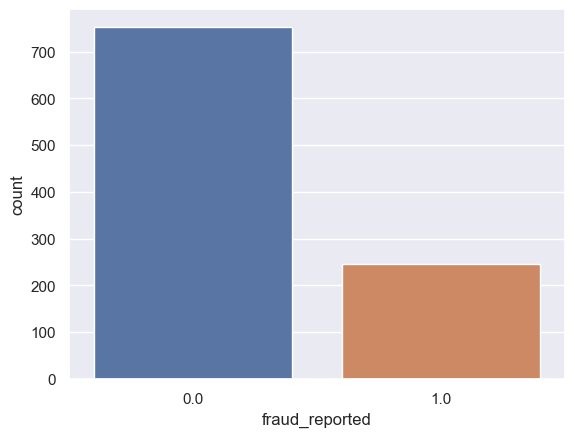

In [70]:
#plt.figure(figsize=(3,2))
sns.set(font_scale=1)
sns.countplot(data['fraud_reported'])
plt.xlabel('fraud_reported')
plt.show()

#### Observation : As we can see from the graph the Target column is having imbalance in the data

### # Using Oversampling Method for balancing the data

In [33]:
from imblearn.over_sampling import SMOTE
X=data.drop(['fraud_reported'], axis=1)
y=data['fraud_reported']

sm=SMOTE()
x1,y1=sm.fit_resample(X,y)

In [34]:
y1.value_counts()

1.0    753
0.0    753
Name: fraud_reported, dtype: int64

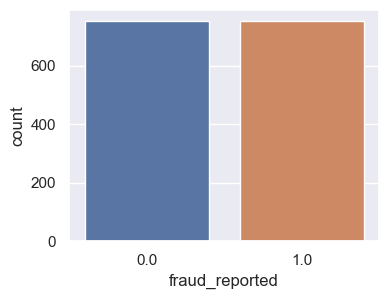

In [71]:
plt.figure(figsize=(4,3))
sns.set(font_scale=1)
sns.countplot(y1)
plt.xlabel('fraud_reported', fontsize=12)
plt.show()

#### Now we are having equal samples for data

### # Model buliding

In [36]:
# Importing all other libraries for modeling
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression

In [37]:
X=x1
y=y1
X.head()

,months_as_customer,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,property_damage,bodily_injuries,witnesses,police_report_available,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,policy_bind_date_day,policy_bind_date_mth,policy_bind_date_year,incident_date_day,incident_date_mth
0,328.0,2.0,1.0,1000.0,1406.91,0.0,466132.0,1.0,4.0,2.0,17.0,0.0,53300.0,0.0,2.0,3.0,0.0,4.0,4.0,1.0,996.0,5.0,2.0,1.0,2.0,2.0,6510.0,13020.0,52080.0,10.0,1.0,2004.0,17.0,10.0,2014.0,25.0,1.0
1,228.0,1.0,1.0,2000.0,1197.22,5000000.0,468176.0,1.0,4.0,6.0,15.0,2.0,0.0,0.0,3.0,0.0,1.0,4.0,5.0,5.0,628.0,8.0,0.0,0.0,0.0,0.0,780.0,780.0,3510.0,8.0,12.0,2007.0,27.0,6.0,2006.0,21.0,1.0
2,134.0,2.0,0.0,2000.0,1413.14,5000000.0,430632.0,0.0,6.0,11.0,2.0,3.0,35100.0,0.0,0.0,2.0,1.0,4.0,1.0,1.0,685.0,7.0,1.0,2.0,3.0,1.0,7700.0,3850.0,23100.0,4.0,30.0,2007.0,9.0,6.0,2000.0,22.0,2.0
3,256.0,0.0,1.0,2000.0,1415.74,6000000.0,608117.0,0.0,6.0,1.0,2.0,4.0,48900.0,-62400.0,2.0,1.0,0.0,4.0,2.0,0.0,669.0,5.0,0.0,1.0,2.0,1.0,6340.0,6340.0,50720.0,3.0,34.0,2014.0,25.0,5.0,1990.0,1.0,10.0
4,228.0,0.0,2.0,1000.0,1583.91,6000000.0,610706.0,1.0,0.0,11.0,2.0,4.0,66000.0,-46000.0,3.0,0.0,1.0,2.0,1.0,0.0,220.0,20.0,1.0,0.0,1.0,1.0,1300.0,650.0,4550.0,0.0,31.0,2009.0,6.0,6.0,2014.0,17.0,2.0


In [38]:
y.head()

0    1.0
1    1.0
2    0.0
3    1.0
4    0.0
Name: fraud_reported, dtype: float64

#### # Standard Scaler

In [39]:
sc=StandardScaler()
X=pd.DataFrame(sc.fit_transform(X) , columns=X.columns)

X.head()

,months_as_customer,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,property_damage,bodily_injuries,witnesses,police_report_available,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,policy_bind_date_day,policy_bind_date_mth,policy_bind_date_year,incident_date_day,incident_date_mth
0,1.095857,1.23704,0.089042,-0.228895,0.673299,-0.483636,-0.520107,1.120370,0.549415,-1.225579,1.395643,-1.523781,1.040472,0.975252,0.859009,1.280189,-1.050302,1.292133,0.402694,-0.977884,1.805011,-1.008203,1.374433,-0.004517,0.451316,1.396074,-0.266837,1.130875,0.705677,0.932892,-1.743267,-0.204406,0.160735,1.090172,1.798286,1.238706,-0.792268
1,0.192821,-0.03985,0.089042,1.497768,-0.225529,1.662671,-0.491395,1.120370,0.549415,-0.178837,1.023558,-0.267037,-0.903912,0.975252,1.848767,-1.795137,0.041742,1.292133,0.902541,1.081651,0.458208,-0.549474,-1.194889,-1.302540,-1.471003,-1.257062,-1.527880,-1.533143,-2.130692,0.409949,-0.686091,0.326327,1.344784,-0.163779,0.635817,0.835578,-0.792268
2,-0.656032,1.23704,-1.238315,1.497768,0.700004,1.662671,-1.018776,-1.018912,1.642946,1.129590,-1.394997,0.361335,0.376536,0.975252,-1.120506,0.255080,0.041742,1.292133,-1.096846,-0.977884,0.666816,-0.702383,0.089772,1.293506,1.412476,0.069506,-0.004945,-0.864962,-0.986684,-0.635936,1.043833,0.326327,-0.786505,-0.163779,-0.236034,0.936360,-0.475472
3,0.445671,-1.31674,0.089042,1.497768,0.711149,2.091933,1.474357,-1.018912,1.642946,-1.487265,-1.394997,0.989707,0.879960,-1.306220,0.859009,-0.770028,-1.050302,1.292133,-0.596999,-1.492768,0.608260,-1.008203,-1.194889,-0.004517,0.451316,0.069506,-0.304250,-0.323017,0.626257,-0.897407,1.428261,1.564703,1.107974,-0.477267,-1.689120,-1.180063,2.058897
4,0.192821,-1.31674,1.416399,-0.228895,1.432003,2.091933,1.510725,1.120370,-1.637646,1.129590,-1.394997,0.989707,1.503768,-0.706602,1.848767,-1.795137,0.041742,-0.088224,-1.096846,-1.492768,-1.034985,1.285442,0.089772,-1.302540,-0.509844,0.069506,-1.413440,-1.561437,-2.069959,-1.681820,1.139940,0.680149,-1.141720,-0.163779,1.798286,0.432450,-0.475472


#### # Test train split

In [40]:
# Random Forest Classifier
rs=0
max_acc=0
for i in range(50):
    x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=i)
    print('working at random state : ', i)
    rf=RandomForestClassifier()
    rf.fit(x_train,y_train)
    y_pred=rf.predict(x_test)
    accuracy=accuracy_score(y_test,y_pred)
    if accuracy > max_acc:
        max_acc=accuracy
        rs=i
print("Max accuracy score : ", max_acc, "   , at Random state : ", rs)

working at random state :  0
working at random state :  1
working at random state :  2
working at random state :  3
working at random state :  4
working at random state :  5
working at random state :  6
working at random state :  7
working at random state :  8
working at random state :  9
working at random state :  10
working at random state :  11
working at random state :  12
working at random state :  13
working at random state :  14
working at random state :  15
working at random state :  16
working at random state :  17
working at random state :  18
working at random state :  19
working at random state :  20
working at random state :  21
working at random state :  22
working at random state :  23
working at random state :  24
working at random state :  25
working at random state :  26
working at random state :  27
working at random state :  28
working at random state :  29
working at random state :  30
working at random state :  31
working at random state :  32
working at random st

In [41]:
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=rs)
x_test

,months_as_customer,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,property_damage,bodily_injuries,witnesses,police_report_available,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,policy_bind_date_day,policy_bind_date_mth,policy_bind_date_year,incident_date_day,incident_date_mth
1475,1.865763,-0.415636,-0.847677,0.989615,-0.903924,-0.483636,-0.617716,-0.389327,0.227592,1.498934,0.136918,0.102819,1.197808,0.975252,-1.120506,0.978502,-0.407530,-0.007399,1.108180,-0.614530,0.993860,0.287170,0.618288,-0.920535,-1.188137,0.069506,0.234188,0.506046,0.194228,-1.066218,0.399369,-0.307994,0.467237,0.721137,-1.312975,0.811357,-0.605804
640,-0.222575,1.237040,1.416399,1.497768,0.819682,-0.483636,-0.949917,-1.018912,1.096181,-1.487265,0.465430,-1.523781,1.058712,-1.887556,0.859009,1.280189,1.133786,1.292133,-1.096846,1.081651,0.875424,0.979623,-1.194889,1.293506,1.412476,1.396074,0.094089,1.844762,1.471853,-0.635936,1.043833,-0.027495,-1.378529,1.090172,1.071743,-1.180063,1.425305
621,-1.080459,1.237040,-1.238315,-1.092227,-0.863483,-0.483636,1.654791,-1.018912,1.096181,1.652961,0.837515,0.361335,-0.903912,0.975252,0.859009,1.280189,0.041742,1.292133,-1.096846,1.081651,0.454549,-1.466932,-1.194889,1.293506,-0.509844,1.396074,-0.313053,-1.017316,-0.864049,-0.374464,-0.493877,-1.619693,-1.733744,-1.104242,0.345200,0.029322,-0.475472
1496,-0.161700,-0.039850,-0.085536,-0.978679,-0.015821,-0.483636,-0.393976,1.120370,-0.213087,0.978263,1.459341,1.370142,0.878803,0.975252,0.598657,-0.500377,-1.050302,-1.377808,-1.267985,-0.842446,-1.000068,-0.939890,-1.025926,-1.131820,1.286061,-0.104969,0.577562,0.549063,0.001375,0.465083,0.985647,0.824560,1.235773,0.149709,-0.786628,-0.994490,1.175309
1190,-1.172324,-0.039850,0.247940,0.047746,-0.485967,-0.483636,-0.601590,1.120370,0.002650,-0.555702,0.316730,-0.618835,-0.903912,-0.274423,-1.120506,-0.770028,-1.050302,0.601955,0.742373,1.081651,-1.509661,-0.414869,-0.475665,-1.302540,0.989426,-0.089298,-0.363448,0.131910,0.146060,0.336283,-0.121303,0.652125,1.529479,0.989719,-0.474467,0.556996,-0.373960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
541,0.292155,1.237040,0.089042,-0.228895,0.324081,2.521194,-0.396971,-1.018912,0.002650,-0.702208,0.651472,-0.267037,0.971160,0.744911,-0.130748,-1.795137,2.225830,1.292133,-1.596692,-1.492768,0.293518,1.591262,-1.194889,-1.302540,0.451316,1.396074,-1.334212,-1.522261,-1.850968,0.409949,-0.686091,1.387792,-0.549695,1.403659,1.652977,0.533232,-0.475472
580,0.436641,-1.316740,1.416399,-1.092227,-0.246747,-0.483636,1.362922,1.120370,-0.544115,1.129590,-1.767083,0.361335,-0.903912,-0.494542,0.859009,-0.770028,1.133786,0.601955,-1.596692,1.081651,-0.914212,0.673804,0.089772,1.293506,-1.471003,1.396074,0.994206,0.961109,0.166084,-0.374464,-0.301663,0.149416,-0.312885,1.090172,-1.689120,-1.180063,0.158120
1210,0.811772,1.237040,0.288887,1.107822,-1.226887,1.662671,-0.890705,1.120370,0.220134,0.789106,-0.836869,1.334258,0.695900,-0.592356,0.859009,-0.770028,0.206159,-0.882316,-0.720564,-1.492768,-0.246600,1.744171,0.089772,-0.911682,-1.326293,-0.130221,1.618461,0.195347,0.999239,-0.256364,-0.604454,0.626878,-1.075472,0.604791,-1.215649,-0.912371,0.062727
790,0.165730,1.237040,0.089042,-1.092227,0.603901,-0.483636,-0.761477,1.120370,1.096181,1.391275,0.651472,-0.267037,2.156761,-0.929631,-0.130748,-1.795137,2.225830,-0.088224,0.402694,0.566767,1.032795,-0.855293,1.374433,1.293506,-0.509844,1.396074,-1.466258,-1.587555,-2.088062,0.671420,0.947726,1.033971,-1.378529,0.463196,-0.817268,0.734796,-0.475472


In [42]:
# Random Forest Classifier
rf=RandomForestClassifier()
rf.fit(x_train,y_train)
rfc_y_pred=rf.predict(x_test)
print("accuracy_score :", accuracy_score(y_test,rfc_y_pred)* 100,' %' )
print("\n confusion_matrix  : \n", confusion_matrix(y_test,rfc_y_pred))
print("\n classification_report  : \n", classification_report(y_test,rfc_y_pred))

accuracy_score : 90.45092838196287  %

 confusion_matrix  : 
 [[186  17]
 [ 19 155]]

 classification_report  : 
               precision    recall  f1-score   support

         0.0       0.91      0.92      0.91       203
         1.0       0.90      0.89      0.90       174

    accuracy                           0.90       377
   macro avg       0.90      0.90      0.90       377
weighted avg       0.90      0.90      0.90       377



In [43]:
#Support Vector Classifier
svc=SVC()
svc.fit(x_train, y_train)
svc_y_pred=svc.predict(x_test)
print("accuracy_score :", accuracy_score(y_test,svc_y_pred)* 100,' %')
print("\n confusion_matrix  : \n", confusion_matrix(y_test,svc_y_pred))
print("\n classification_report  : \n", classification_report(y_test,svc_y_pred))

accuracy_score : 88.3289124668435  %

 confusion_matrix  : 
 [[179  24]
 [ 20 154]]

 classification_report  : 
               precision    recall  f1-score   support

         0.0       0.90      0.88      0.89       203
         1.0       0.87      0.89      0.88       174

    accuracy                           0.88       377
   macro avg       0.88      0.88      0.88       377
weighted avg       0.88      0.88      0.88       377



In [44]:
#Gradient Boosting Classifier
gb=GradientBoostingClassifier()
gb.fit(x_train, y_train)
gb_y_pred=gb.predict(x_test)
print("accuracy_score :", accuracy_score(y_test,gb_y_pred)* 100,' %')
print("\n confusion_matrix  : \n", confusion_matrix(y_test,gb_y_pred))
print("\n classification_report  : \n", classification_report(y_test,gb_y_pred))

accuracy_score : 91.77718832891246  %

 confusion_matrix  : 
 [[185  18]
 [ 13 161]]

 classification_report  : 
               precision    recall  f1-score   support

         0.0       0.93      0.91      0.92       203
         1.0       0.90      0.93      0.91       174

    accuracy                           0.92       377
   macro avg       0.92      0.92      0.92       377
weighted avg       0.92      0.92      0.92       377



In [45]:
#AdaBoost Classifier
ab=AdaBoostClassifier()
ab.fit(x_train, y_train)
ab_y_pred=ab.predict(x_test)
print("accuracy_score :", accuracy_score(y_test,ab_y_pred)* 100,' %')
print("\n confusion_matrix  : \n", confusion_matrix(y_test,ab_y_pred))
print("\n classification_report  : \n", classification_report(y_test,ab_y_pred))

accuracy_score : 89.65517241379311  %

 confusion_matrix  : 
 [[184  19]
 [ 20 154]]

 classification_report  : 
               precision    recall  f1-score   support

         0.0       0.90      0.91      0.90       203
         1.0       0.89      0.89      0.89       174

    accuracy                           0.90       377
   macro avg       0.90      0.90      0.90       377
weighted avg       0.90      0.90      0.90       377



In [46]:
#Bagging Classifier
bag=BaggingClassifier()
bag.fit(x_train,y_train)
bag_y_pred=bag.predict(x_test)
print("accuracy_score :", accuracy_score(y_test,bag_y_pred)* 100,' %')
print("\n confusion_matrix  : \n", confusion_matrix(y_test,bag_y_pred))
print("\n classification_report  : \n", classification_report(y_test,bag_y_pred))

accuracy_score : 89.65517241379311  %

 confusion_matrix  : 
 [[187  16]
 [ 23 151]]

 classification_report  : 
               precision    recall  f1-score   support

         0.0       0.89      0.92      0.91       203
         1.0       0.90      0.87      0.89       174

    accuracy                           0.90       377
   macro avg       0.90      0.89      0.90       377
weighted avg       0.90      0.90      0.90       377



In [47]:
#Extra Trees Classifier
et=ExtraTreesClassifier()
et.fit(x_train,y_train)
et_y_pred=et.predict(x_test)
print("accuracy_score :", accuracy_score(y_test,et_y_pred)* 100,' %')
print("\n confusion_matrix  : \n", confusion_matrix(y_test,et_y_pred))
print("\n classification_report  : \n", classification_report(y_test,et_y_pred))


accuracy_score : 92.83819628647215  %

 confusion_matrix  : 
 [[188  15]
 [ 12 162]]

 classification_report  : 
               precision    recall  f1-score   support

         0.0       0.94      0.93      0.93       203
         1.0       0.92      0.93      0.92       174

    accuracy                           0.93       377
   macro avg       0.93      0.93      0.93       377
weighted avg       0.93      0.93      0.93       377



In [48]:
#Logistic Regression
lr=LogisticRegression()
lr.fit(x_train,y_train)
lr_y_pred=lr.predict(x_test)
print("accuracy_score :", accuracy_score(y_test,lr_y_pred)* 100,' %')
print("\n confusion_matrix  : \n", confusion_matrix(y_test,lr_y_pred))
print("\n classification_report  : \n", classification_report(y_test,lr_y_pred))


accuracy_score : 75.86206896551724  %

 confusion_matrix  : 
 [[149  54]
 [ 37 137]]

 classification_report  : 
               precision    recall  f1-score   support

         0.0       0.80      0.73      0.77       203
         1.0       0.72      0.79      0.75       174

    accuracy                           0.76       377
   macro avg       0.76      0.76      0.76       377
weighted avg       0.76      0.76      0.76       377



#### So, the best accuracy scores is 92.83 % with 'Extra Trees Classifier'

### # Cross validation score

In [49]:
from sklearn.model_selection import cross_val_score

In [50]:
#Cross validation for Random forest classifier
cv_score = cross_val_score(rf,X,y,cv=5,scoring='accuracy')
print(cv_score, '\n')
print('Average CV Score', cv_score.mean()*100,'  %')
print('difference in score Random forest classifier : ', (accuracy_score(y_test,rfc_y_pred)-cv_score.mean()))

[0.67549669 0.79401993 0.91694352 0.94019934 0.95348837] 

Average CV Score 85.6029570306484   %
difference in score Random forest classifier :  0.04847971351314473


In [51]:
#Cross validation for support vector classifier
cv_score = cross_val_score(svc,X,y,cv=5,scoring='accuracy')
print(cv_score, '\n')
print('Average CV Score', cv_score.mean()*100,'  %')
print('difference in score support vector classifier : ', (accuracy_score(y_test,svc_y_pred)-cv_score.mean()))

[0.76821192 0.84385382 0.90365449 0.910299   0.93355482] 

Average CV Score 87.19148093551297   %
difference in score support vector classifier :  0.01137431531330535


In [52]:
#Cross validation for Gradient Boosting classifier
cv_score = cross_val_score(gb,X,y,cv=5,scoring='accuracy')
print(cv_score, '\n')
print('Average CV Score', cv_score.mean()*100,'  %')
print('difference in score Gradient Boosting classifier :  ', (accuracy_score(y_test,gb_y_pred)-cv_score.mean()))

[0.74172185 0.81395349 0.91362126 0.93355482 0.94019934] 

Average CV Score 86.86101515918241   %
difference in score Gradient Boosting classifier :   0.049161731697300426


In [53]:
#Cross validation for AdaBoost classifier
cv_score = cross_val_score(ab,X,y,cv=5,scoring='accuracy')
print(cv_score, '\n')
print('Average CV Score', cv_score.mean()*100,'  %')
print('difference in score AdaBoost classifier : ', (accuracy_score(y_test,ab_y_pred)-cv_score.mean()))

[0.64900662 0.78405316 0.92026578 0.93023256 0.94352159] 

Average CV Score 84.54159424435105   %
difference in score AdaBoost classifier :  0.05113578169442057


In [54]:
#Cross validation for Bagging classifier
cv_score = cross_val_score(bag,X,y,cv=5,scoring='accuracy')
print(cv_score, '\n')
print('Average CV Score', cv_score.mean()*100,'  %')
print('difference in score Bagging classifier : ', (accuracy_score(y_test,bag_y_pred)-cv_score.mean()))

[0.77152318 0.81727575 0.89700997 0.93355482 0.91362126] 

Average CV Score 86.6596994565576   %
difference in score Bagging classifier :  0.02995472957235501


In [55]:
#Cross validation for Extratree classifier
cv_score = cross_val_score(et,X,y,cv=5,scoring='accuracy')
print(cv_score, '\n')
print('Average CV Score', cv_score.mean()*100,'  %')
print('difference in score Extratree classifier : ', (accuracy_score(y_test,et_y_pred)-cv_score.mean()))

[0.82119205 0.87375415 0.94019934 0.94684385 0.95016611] 

Average CV Score 90.6431101625927   %
difference in score Extratree classifier :  0.021950861238794528


In [56]:
#Cross validation for Logistic Regression
cv_score = cross_val_score(lr,X,y,cv=5,scoring='accuracy')
print(cv_score, '\n')
print('Average CV Score', cv_score.mean()*100,'  %')
print('difference in score Linear Regression : ', (accuracy_score(y_test,lr_y_pred)-cv_score.mean()))

[0.73178808 0.74750831 0.73089701 0.72093023 0.7641196 ] 

Average CV Score 73.90486457943719   %
difference in score Linear Regression :  0.01957204386080047


#### Average Cross Val score for ' Extra Trees classifier ' is  90.64 % and difference in score for Prediction done earlier and avg CV score for ' Extra Trees classifier ' is 0.0219 or 2.19% 

#### ----------------------------------------------------------------------------------------------------------------  
####  ----------------------------------------------------------------------------------------------------------------
#### #so taking the highest Avg CV score in consideration we select 'Extra Trees Classifier' as our final model

### # Hyper Parameter Tuning

In [57]:
from sklearn.model_selection import GridSearchCV

In [58]:
params={'criterion':['gini','entropy'],
        'min_samples_split' : [2,3,5],
       'min_samples_leaf' : [1,2,3],
        'max_features' : ['sqrt', 'log2', 'None'],
        'n_jobs' : [-2,-1,1]        
       }


In [59]:
grid_search = GridSearchCV(estimator=ExtraTreesClassifier(),param_grid=params,cv=3)

In [60]:
grid_search.fit(x_train,y_train)

GridSearchCV(cv=3, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_features': ['sqrt', 'log2', 'None'],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 3, 5],
                         'n_jobs': [-2, -1, 1]})

In [61]:
print('Best Score  : ',grid_search.best_score_)
print('\nBest Parameters : ', grid_search.best_params_)

Best Score  :  0.8813138438963825

Best Parameters :  {'criterion': 'entropy', 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_jobs': 1}


In [62]:
#Final Model

Final_Model=ExtraTreesClassifier(criterion='entropy',max_features='sqrt', min_samples_leaf=1, min_samples_split=2 , n_jobs=1)

Final_Model.fit(x_train,y_train)
Final_Model_y_pred=Final_Model.predict(x_test)
print("accuracy_score :", accuracy_score(y_test,Final_Model_y_pred))
print("\n classification_report  : \n", classification_report(y_test,Final_Model_y_pred))

accuracy_score : 0.9442970822281167

 classification_report  : 
               precision    recall  f1-score   support

         0.0       0.95      0.95      0.95       203
         1.0       0.94      0.94      0.94       174

    accuracy                           0.94       377
   macro avg       0.94      0.94      0.94       377
weighted avg       0.94      0.94      0.94       377



### # Confusion Matrix

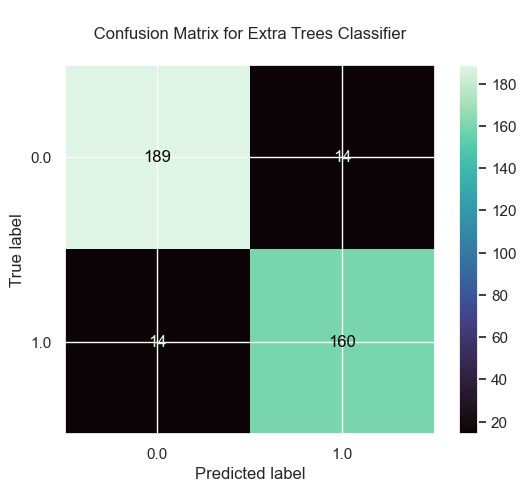

In [72]:
from sklearn import metrics

class_names = data.columns
metrics.plot_confusion_matrix(Final_Model.fit(x_train,y_train), x_test, y_test, cmap='mako')
plt.title('\n Confusion Matrix for Extra Trees Classifier \n')
plt.show()

### #Saving Model

In [64]:
#saving the model
import pickle
pickle.dump(Final_Model, open('Insurance_claim_fraud_detction_project.pkl', 'wb'))

In [65]:
#load model
load_model=pickle.load(open('Insurance_claim_fraud_detction_project.pkl', 'rb'))
prediction = load_model.predict(x_test)
prediction

array([1., 0., 0., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 1., 1., 1., 0.,
       1., 0., 0., 1., 1., 1., 0., 1., 0., 1., 0., 1., 1., 1., 0., 0., 1.,
       0., 1., 1., 1., 0., 1., 1., 1., 1., 0., 0., 0., 0., 1., 1., 1., 0.,
       1., 1., 1., 1., 0., 1., 1., 0., 1., 1., 0., 0., 1., 1., 0., 0., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 1., 0., 1., 0., 1., 1., 0., 1., 0., 0., 0., 0., 1., 0., 1., 0.,
       1., 0., 1., 0., 0., 0., 1., 1., 1., 0., 1., 1., 0., 0., 0., 1., 0.,
       0., 0., 1., 0., 1., 0., 1., 0., 1., 1., 0., 0., 1., 1., 0., 1., 0.,
       0., 1., 0., 0., 0., 1., 0., 1., 0., 1., 0., 1., 0., 1., 0., 1., 0.,
       0., 0., 0., 0., 1., 1., 0., 1., 0., 0., 1., 0., 0., 0., 0., 1., 1.,
       1., 1., 0., 0., 1., 0., 1., 1., 1., 1., 0., 0., 0., 0., 0., 1., 0.,
       1., 1., 0., 1., 1., 0., 0., 1., 0., 1., 0., 0., 0., 1., 1., 1., 0.,
       1., 1., 0., 1., 1., 1., 0., 0., 0., 1., 0., 1., 1., 0., 1., 1., 0.,
       1., 0., 0., 0., 0.

In [66]:
df=pd.DataFrame()
df['Actual'] = y_test
df['predicted']=prediction

df.sample(10)

,Actual,predicted
680,0.0,0.0
904,0.0,0.0
121,1.0,1.0
1092,1.0,1.0
308,0.0,0.0
355,0.0,0.0
1149,1.0,1.0
740,0.0,0.0
1088,1.0,1.0
624,0.0,0.0


### Fianl Comments

The model is successfully predicting if an insurance claim is fraudulent or not using Extra Trees Classifier Model with the accuracy of 94.42 %